In [1]:
%pylab inline
%load_ext autoreload
%autoreload 2

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
images = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/SkinCancerMNIST/SkinCancer_images.npy')
masks = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/SkinCancerMNIST/SkinCancer_masks.npy')

In [3]:
images.shape

(12311, 512, 512, 1)

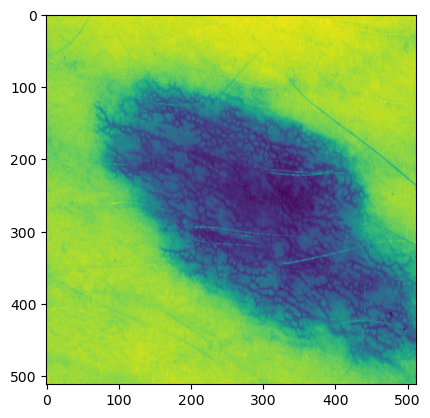

In [4]:
imshow(images[3])

In [5]:
masks.shape

(12311, 512, 512, 1)

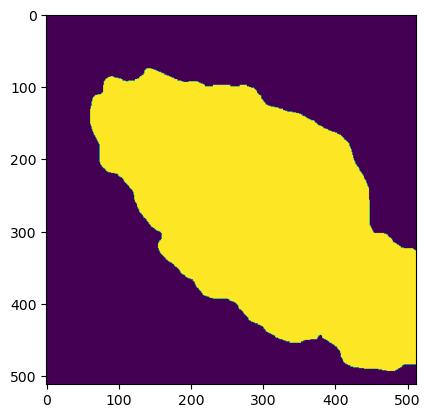

In [6]:
imshow(masks[3])

In [7]:
import sys
sys.path.append('../')
import gp2
from runner import Runner

In [8]:
from keras import losses

In [9]:
loss_fx = losses.BCE

In [10]:
R = Runner(verbose=True)

*** GP2 ***
Working directory: /tmp/tmpwizwsrmnGP2
Verbose mode active!


In [11]:
C = gp2.KUC_UNet2D(loss=loss_fx, workingdir=R.workingdir)

*** GP2  KUC U-Net2D ***
Working directory: /tmp/tmpwizwsrmnGP2


In [12]:
R.classifier = C

In [13]:
R.run(images, masks, runs=1, batch_size=16)

Weights OK!
******
Loop 1
Epoch 1/100
39/39 [==============================] - 37s 690ms/step - loss: 0.5544 - dice_coeff: 0.3019 - val_loss: 0.5319 - val_dice_coeff: 0.3174
Epoch 2/100
39/39 [==============================] - 19s 496ms/step - loss: 0.5031 - dice_coeff: 0.3440 - val_loss: 0.4928 - val_dice_coeff: 0.3857
Epoch 3/100
39/39 [==============================] - 19s 489ms/step - loss: 0.4525 - dice_coeff: 0.4230 - val_loss: 0.4273 - val_dice_coeff: 0.4916
Epoch 4/100
39/39 [==============================] - 19s 485ms/step - loss: 0.4128 - dice_coeff: 0.5169 - val_loss: 0.4426 - val_dice_coeff: 0.5224
Epoch 5/100
39/39 [==============================] - 19s 485ms/step - loss: 0.4703 - dice_coeff: 0.5103 - val_loss: 0.4117 - val_dice_coeff: 0.5326
Epoch 6/100
39/39 [==============================] - 19s 483ms/step - loss: 0.4125 - dice_coeff: 0.5231 - val_loss: 0.4119 - val_dice_coeff: 0.5347
Epoch 7/100
39/39 [==============================] - 19s 496ms/step - loss: 0.4158 - d

In [14]:
R.classifier_scores

[[0.4501769244670868, 0.526130735874176]]

In [15]:
R.discriminator_scores

[[0.0002778436173684895, 1.0]]

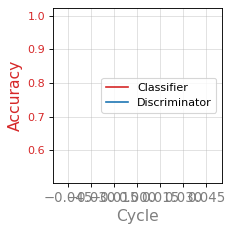

In [16]:
R.plot()

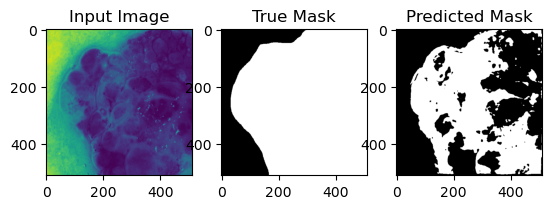

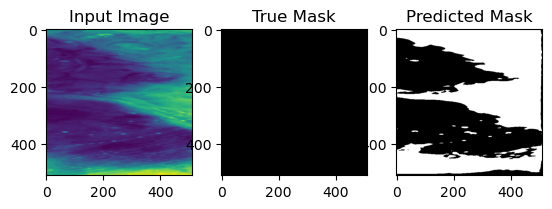

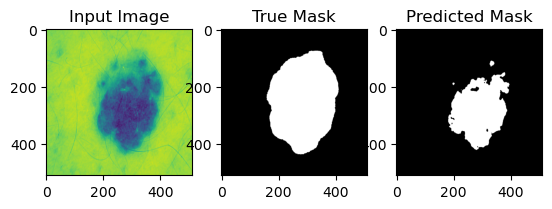

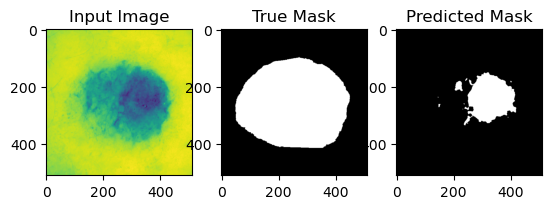

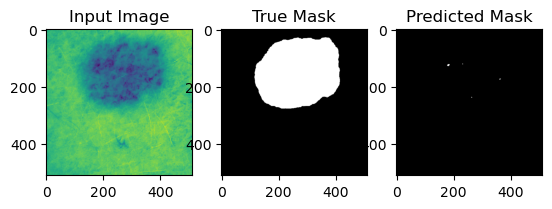

...

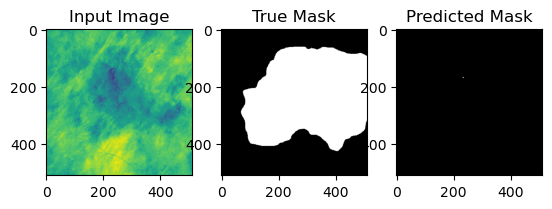

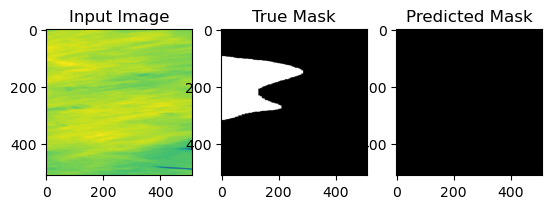

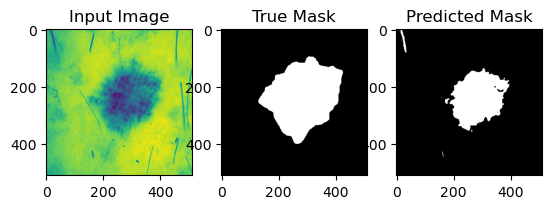

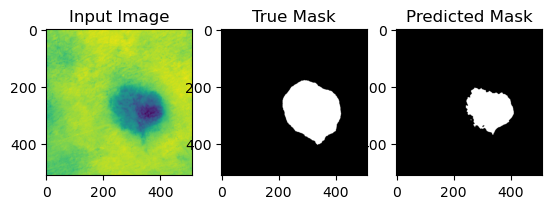

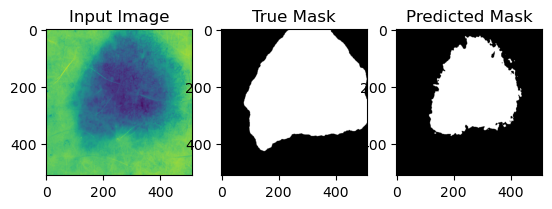

In [17]:
gp2.Util.visualize_predictions(C, images[1000:1500], masks[1000:1500], num_samples=200)